<a href="https://colab.research.google.com/github/anderflash/colab/blob/main/SAAB_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

In [83]:
# Load the image
image_path = '/content/2.png'
image = cv2.imread(image_path, cv2.IMREAD_COLOR)

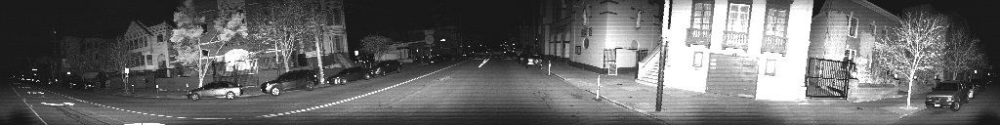

In [84]:
cv2_imshow(image)

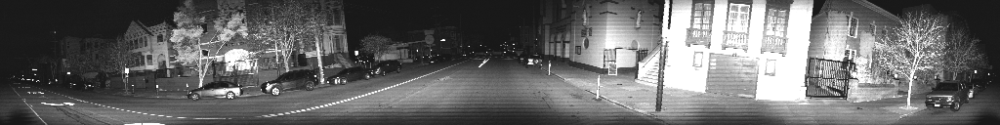

In [85]:
# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

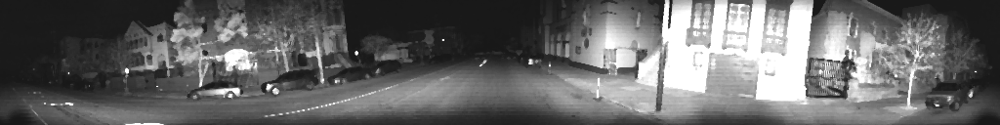

In [86]:
# Apply Gaussian blur to reduce noise and improve edge detection
blurred_image = cv2.medianBlur(gray_image, 3)
#blurred_image = cv2.GaussianBlur(gray_image, (13, 13), 1)
cv2_imshow(blurred_image)

In [87]:
rows = blurred_image.shape[0]

In [88]:
circles = cv2.HoughCircles(gray_image, cv2.HOUGH_GRADIENT, 1, rows/ 16,
  param1=15, param2=10, minRadius=1, maxRadius=5)
if circles is not None:
  print(len(circles[0]))
  print(circles[:,:min(len(circles[0])-1, 5)])


47
[[[246.5  67.5   4.4]
  [235.5  68.5   4.4]
  [439.5  40.5   4.4]
  [176.5  53.5   4.2]
  [725.5  13.5   4.2]]]


In [54]:
def show_circles(circles, image):
  src = image.copy()
  if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
      center = (i[0], i[1])
      # circle center
      cv2.circle(src, center, 1, (0, 100, 100), 1)
      # circle outline
      radius = i[2]
      cv2.circle(src, center, radius, (255, 0, 255), 1)
  cv2_imshow(cv2.resize(src, dsize=None,fx=2, fy=2))

i=0 param2=1 circles=321


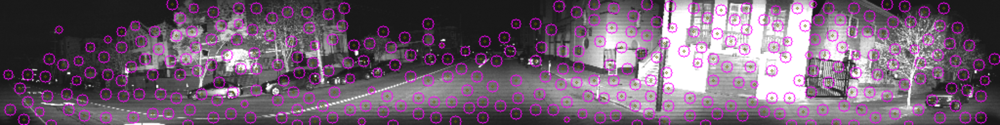

i=1 param2=2 circles=306


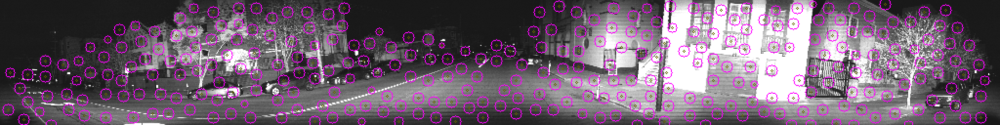

i=2 param2=3 circles=284


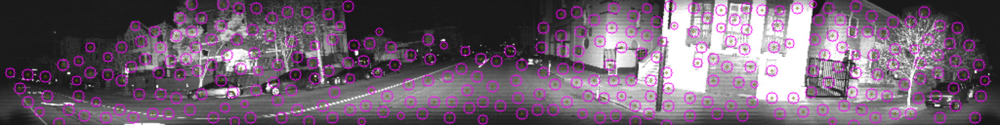

i=3 param2=4 circles=255


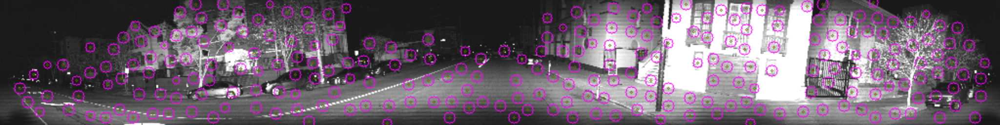

i=4 param2=5 circles=228


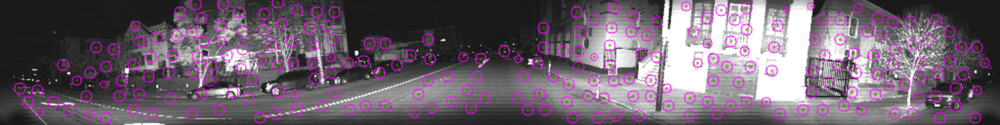

i=5 param2=6 circles=201


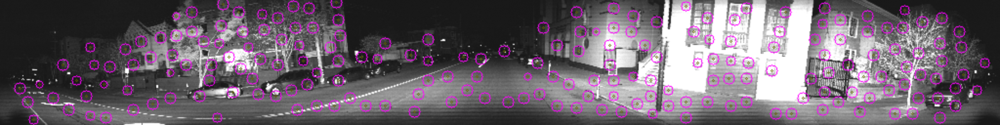

i=6 param2=7 circles=184


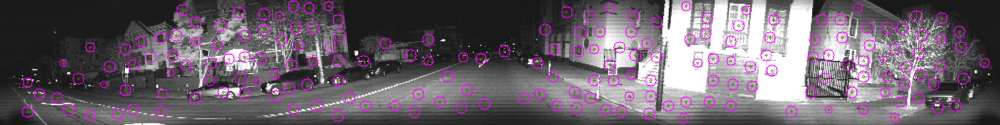

i=7 param2=8 circles=145


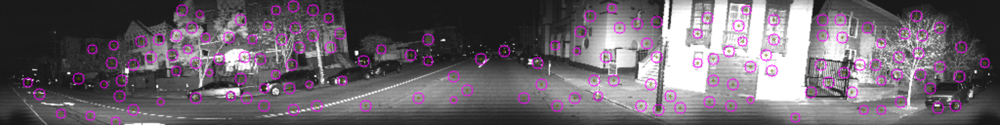

i=8 param2=9 circles=106


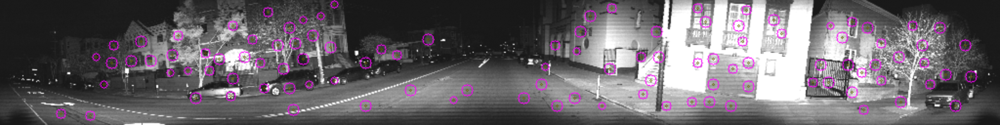

i=9 param2=10 circles=61


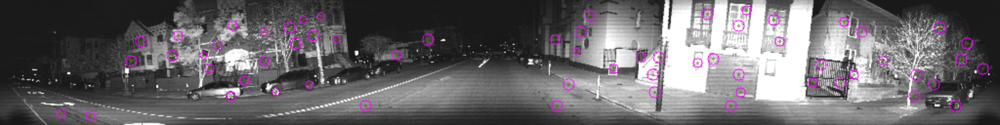

i=10 param2=11 circles=27


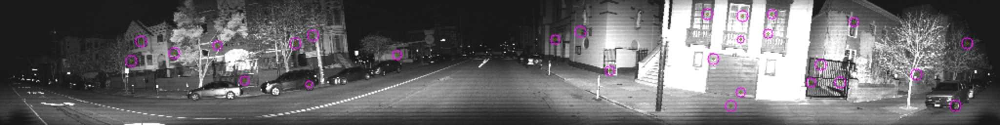

i=11 param2=12 circles=13


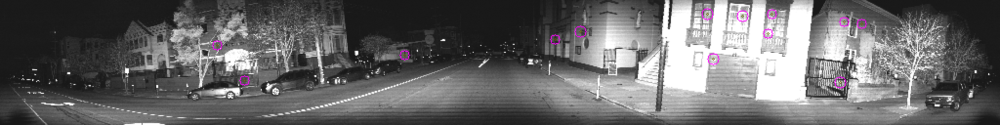

i=12 param2=13 circles=6


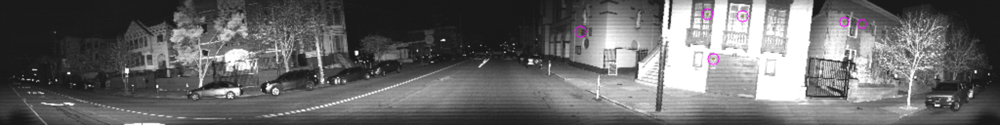

i=13 param2=14 circles=2


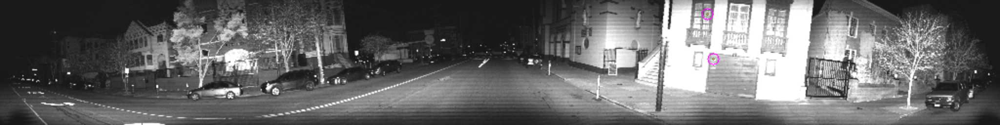

i=14 param2=15 circles=1


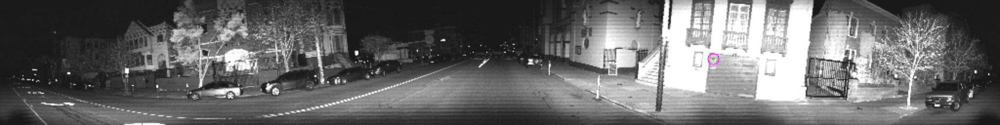

i=15 param2=16 circles=None
i=16 param2=17 circles=None
i=17 param2=18 circles=None
i=18 param2=19 circles=None
i=19 param2=20 circles=None


In [90]:
for i in range(20):
  param2 = i+1 # Hough gradient
  circles = cv2.HoughCircles(gray_image, cv2.HOUGH_GRADIENT, 1, rows/ 8,
    param1=100, param2=param2, minRadius=3, maxRadius=7)
  if circles is not None:
    print(f"i={i} param2={param2} circles={len(circles[0])}")
    show_circles(circles, image)
  else:
    print(f"i={i} param2={param2} circles=None")

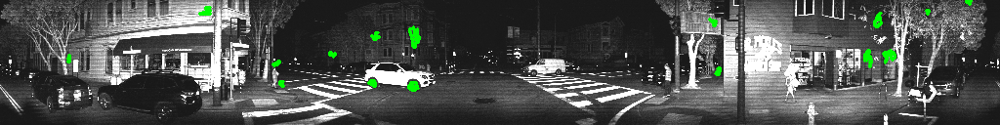

In [ ]:

# Apply Gaussian blur to reduce noise and improve edge detection
blurred_image = cv2.GaussianBlur(gray_image, (13, 13), 1)

# Perform Canny edge detection
edges = cv2.Canny(blurred_image, threshold1=30, threshold2=35)

# Find contours in the edges
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Initialize a list to store circular objects
circular_objects = []

# Iterate through detected contours
for contour in contours:
    # Approximate the contour to a polygon
    approx = cv2.approxPolyDP(contour, 0.04 * cv2.arcLength(contour, True), True)

    # Calculate the number of vertices
    num_vertices = len(approx)

    # Check if the contour is approximately circular
    if num_vertices >= 9:  # You can adjust this threshold based on the circularity you expect
        circular_objects.append(contour)

# Draw the detected circular objects on the original image
result_image = image.copy()
cv2.drawContours(result_image, circular_objects, -1, (0, 255, 0), 2)

# Display the results
cv2_imshow(result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


https://data.ouster.dev/share/CFCN5EP8HNPHKYOC?frame=92